<a href="https://colab.research.google.com/github/georgepar/lt-asrtts/blob/main/notebooks/Lecture%202/time_vs_frequency_domain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Signal time domain vs frequency domain

Source: https://slpcourse.github.io

Text(0.5, 1.0, 'Fourier transform depicting the frequency components')

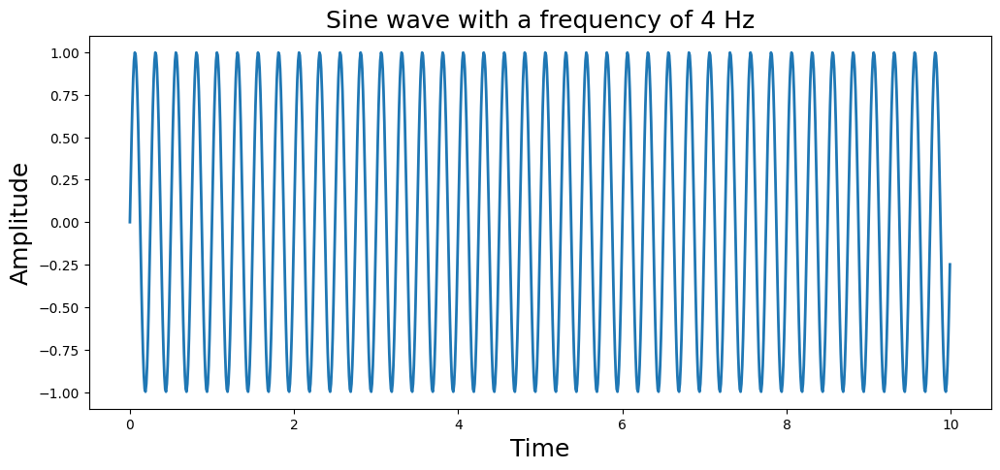

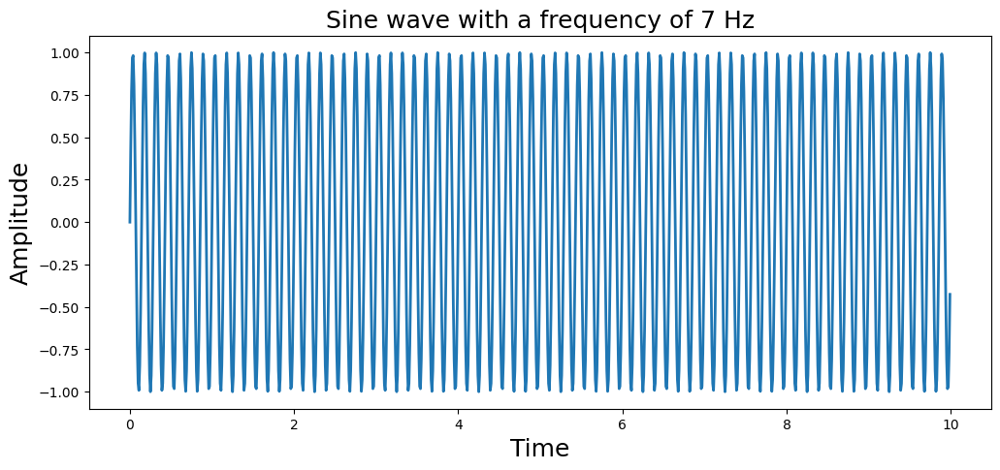

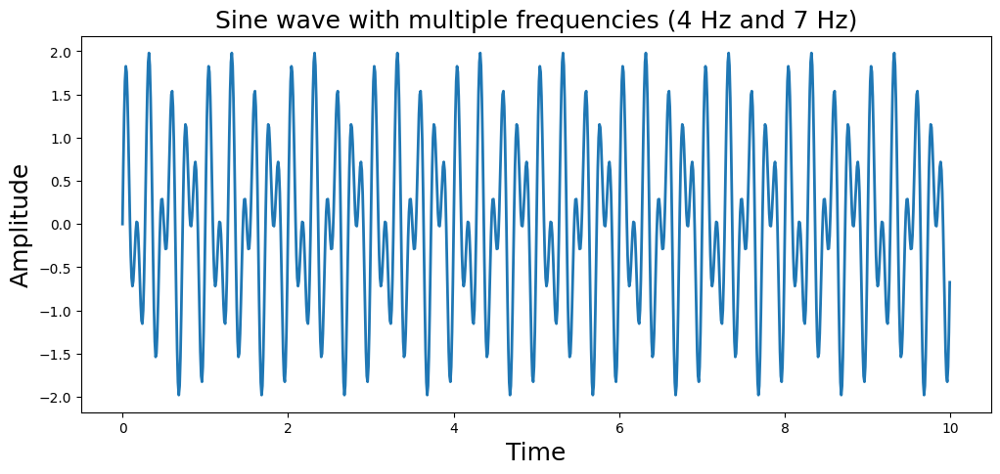

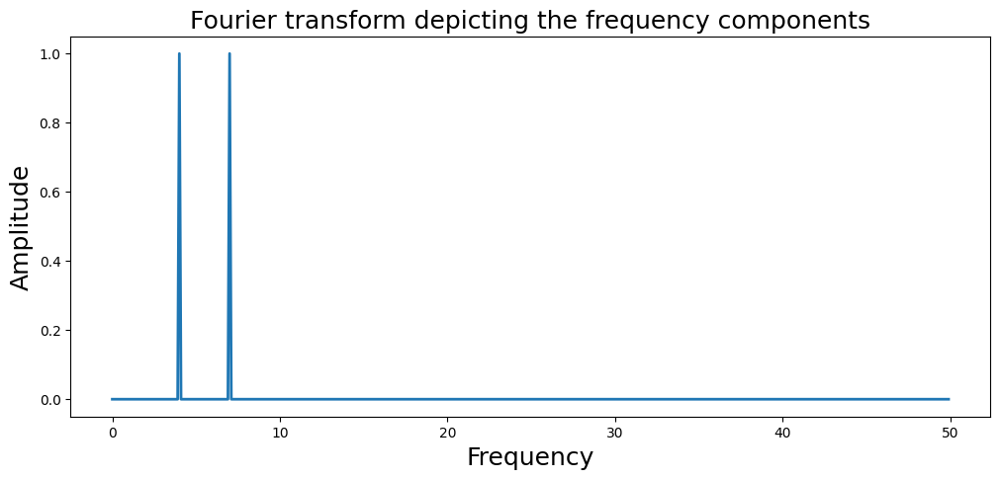

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# How many time points are needed i,e., Sampling Frequency
samplingFrequency   = 100;

# At what intervals time points are sampled
samplingInterval       = 1 / samplingFrequency;

# Begin time period of the signals
beginTime           = 0;

# End time period of the signals
endTime             = 10;

# Frequency of the signals
signal1Frequency     = 4;
signal2Frequency     = 7;

# Time points
time        = np.arange(beginTime, endTime, samplingInterval);

# Create two sine waves
amplitude1 = np.sin(2*np.pi*signal1Frequency*time)
amplitude2 = np.sin(2*np.pi*signal2Frequency*time)

plt.figure(figsize=(12, 5))
plt.plot(time, amplitude1, linewidth=2)
plt.xlabel('Time', fontsize=18)
plt.ylabel('Amplitude', fontsize=18)
plt.title('Sine wave with a frequency of 4 Hz', fontsize=18)

plt.figure(figsize=(12, 5))
plt.plot(time, amplitude2, linewidth=2)
plt.xlabel('Time', fontsize=18)
plt.ylabel('Amplitude', fontsize=18)
plt.title('Sine wave with a frequency of 7 Hz', fontsize=18)


# Add the sine waves
amplitude = amplitude1 + amplitude2

plt.figure(figsize=(12, 5))
plt.plot(time, amplitude, linewidth=2)
plt.xlabel('Time', fontsize=18)
plt.ylabel('Amplitude', fontsize=18)
plt.title('Sine wave with multiple frequencies (4 Hz and 7 Hz)', fontsize=18)


# Frequency domain representation
fourierTransform = 2*np.fft.fft(amplitude)/len(amplitude)           # Normalize amplitude
fourierTransform = fourierTransform[range(int(len(amplitude)/2))] # Exclude sampling frequency


tpCount     = len(amplitude)
values      = np.arange(int(tpCount/2))
timePeriod  = tpCount/samplingFrequency
frequencies = values/timePeriod


plt.figure(figsize=(12, 5))
plt.plot(frequencies, abs(fourierTransform), linewidth=2)
plt.xlabel('Frequency', fontsize=18)
plt.ylabel('Amplitude', fontsize=18)
plt.title('Fourier transform depicting the frequency components', fontsize=18)



## Audio sampling and quantization

In [14]:
!wget -nc https://github.com/georgepar/lt-asrtts/raw/refs/heads/main/notebooks/Lecture%202/male_singing.wav

!pip install pysoundfile
!pip install bitstring
!pip install librosa resampy

--2025-03-04 08:24:23--  https://github.com/georgepar/lt-asrtts/raw/refs/heads/main/notebooks/Lecture%202/male_singing.wav
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/georgepar/lt-asrtts/refs/heads/main/notebooks/Lecture%202/male_singing.wav [following]
--2025-03-04 08:24:24--  https://raw.githubusercontent.com/georgepar/lt-asrtts/refs/heads/main/notebooks/Lecture%202/male_singing.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9765864 (9.3M) [application/octet-stream]
Saving to: ‘male_singing.wav’

male_singing.wav    100%[===================>]   9.31M  26.3MB/s    in 0.4s    

2025-0

Sampling rate: 44100 samples/second
Signal size: 4882893 samples
Signal duration: 110.723 seconds


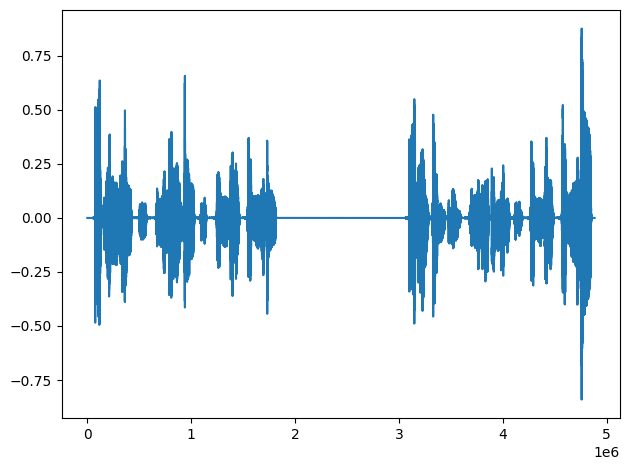

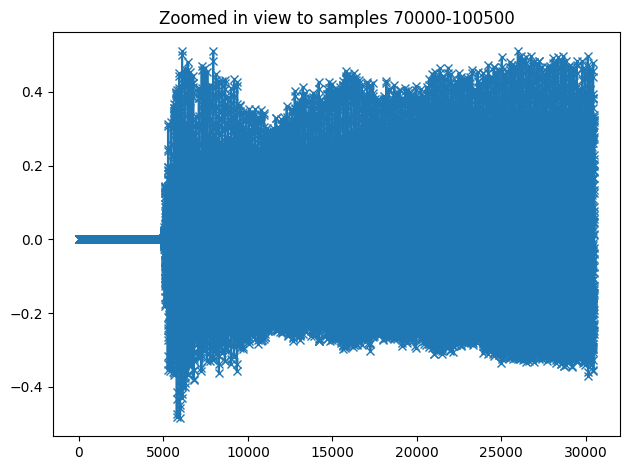

In [22]:
import soundfile
import matplotlib.pyplot as plt
import IPython
audio_signal, sampling_rate = soundfile.read('male_singing.wav')
print('Sampling rate: {} samples/second'.format(sampling_rate))
print('Signal size: {} samples'.format(audio_signal.shape[0]))
print('Signal duration: {:.3f} seconds'.format(audio_signal.shape[0] / sampling_rate))
plt.plot(audio_signal)
plt.tight_layout()
plt.figure()
plt.plot(audio_signal[70000:100500], marker='x')
plt.title('Zoomed in view to samples 70000-100500')
plt.tight_layout()


IPython.display.Audio('male_singing.wav')


### Resampling

In [27]:
import librosa
import IPython.display as ipd

for resample_rate in [4000, 8000, 16000, sampling_rate]:
  resampled_signal = librosa.resample(audio_signal.squeeze(), orig_sr=sampling_rate, target_sr=resample_rate, res_type="kaiser_best")

  print("Audio at sampling rate: ", resample_rate)
  ipd.display(ipd.Audio(resampled_signal, rate=resample_rate))


ModuleNotFoundError: No module named 'resampy'

This error is lazily reported, having originally occured in
  File /usr/local/lib/python3.11/dist-packages/librosa/core/audio.py, line 33, in <module>

----> resampy = lazy.load("resampy")

Text(0, 0.5, 'Amplitude')

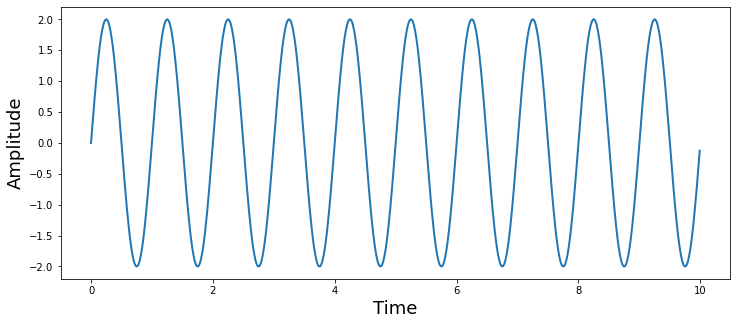

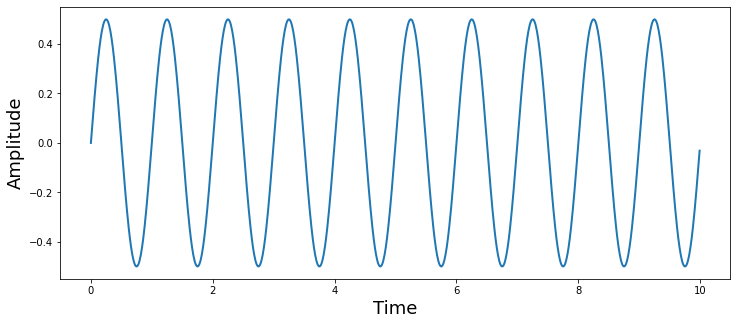

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# How many time points are needed i,e., Sampling Frequency
samplingFrequency   = 100;

# At what intervals time points are sampled
samplingInterval       = 1 / samplingFrequency;

# Begin time period of the signals
beginTime           = 0;

# End time period of the signals
endTime             = 10;

# Frequency of the signals
signal1Frequency     = 1;
signal2Frequency     = 7;

# Time points
time        = np.arange(beginTime, endTime, samplingInterval);

# Create two sine waves
amplitude1 = 2*np.sin(2*np.pi*signal1Frequency*time)
amplitude2 = 0.5*np.sin(2*np.pi*signal1Frequency*time)

plt.figure(figsize=(12, 5))
plt.plot(time, amplitude1, linewidth=2)
plt.xlabel('Time', fontsize=18)
plt.ylabel('Amplitude', fontsize=18)
# plt.title('Sine wave with a frequency of 4 Hz', fontsize=18)

plt.figure(figsize=(12, 5))
plt.plot(time, amplitude2, linewidth=2)
plt.xlabel('Time', fontsize=18)
plt.ylabel('Amplitude', fontsize=18)
# plt.title('Sine wave with a frequency of 7 Hz', fontsize=18)

